In [1]:
# ON CONSOLE
# conda config --add channels conda-forge
# conda config --set channel_priority strict
# conda install r-factoextra

# install.packages("cluster")
# install.packages("NbClust")
# install.packages("fpc")
# install.packages("clValid")

library(factoextra)
library(cluster)
library(NbClust)
library(fpc)
library(clValid)
library(ggplot2)


Loading required package: ggplot2

Welcome! Want to learn more? See two factoextra-related books at https://goo.gl/ve3WBa

Warning message:
“package ‘cluster’ was built under R version 4.3.3”


In [2]:
iris_1 <- iris[1:4]
head(iris_1)


,Sepal.Length,Sepal.Width,Petal.Length,Petal.Width
,<dbl>,<dbl>,<dbl>,<dbl>
1,5.1,3.5,1.4,0.2
2,4.9,3.0,1.4,0.2
3,4.7,3.2,1.3,0.2
4,4.6,3.1,1.5,0.2
5,5.0,3.6,1.4,0.2
6,5.4,3.9,1.7,0.4


In [3]:
set.seed(456)


In [4]:
iris_2 <- data.frame(
    "col1" = sample(1:100, 150, replace = TRUE),
    "col2" = sample(1:100, 150, replace = TRUE),
    "col3" = sample(1:100, 150, replace = TRUE),
    "col4" = sample(1:100, 150, replace = TRUE)
)

head(iris_2)


,col1,col2,col3,col4
,<int>,<int>,<int>,<int>
1,35,34,40,38
2,38,64,42,37
3,85,40,40,90
4,27,24,66,39
5,25,75,71,29
6,78,24,31,32


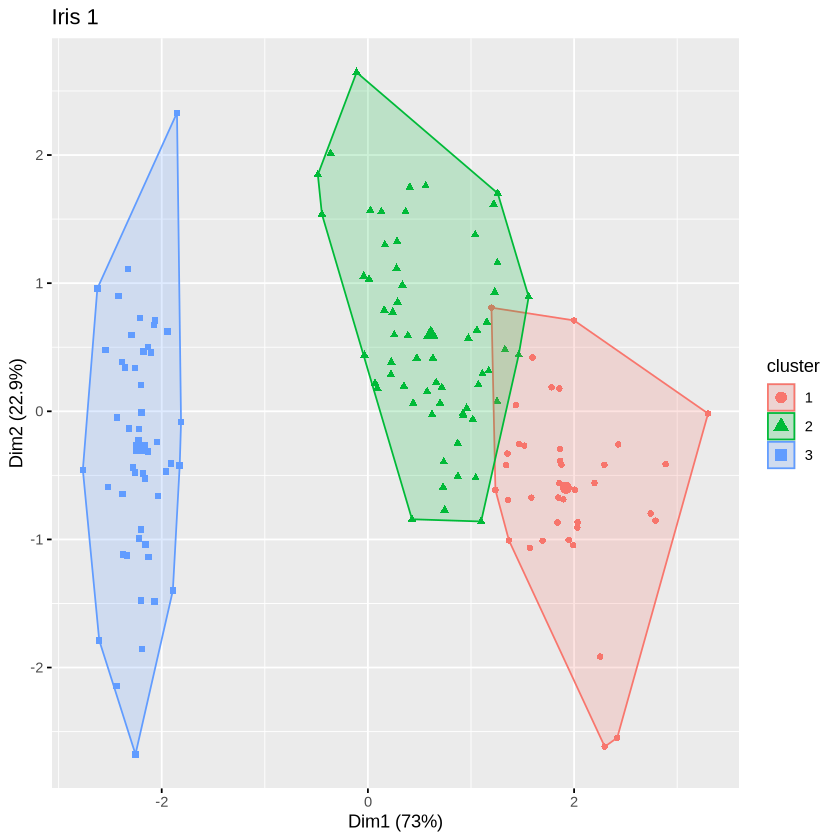

In [5]:
cluster <- kmeans(iris_1, centers = 3)

g1 <- fviz_cluster(cluster, data = iris_1, geom = "point", ellipse.type = "convex", main = "Iris 1")

plot(g1)


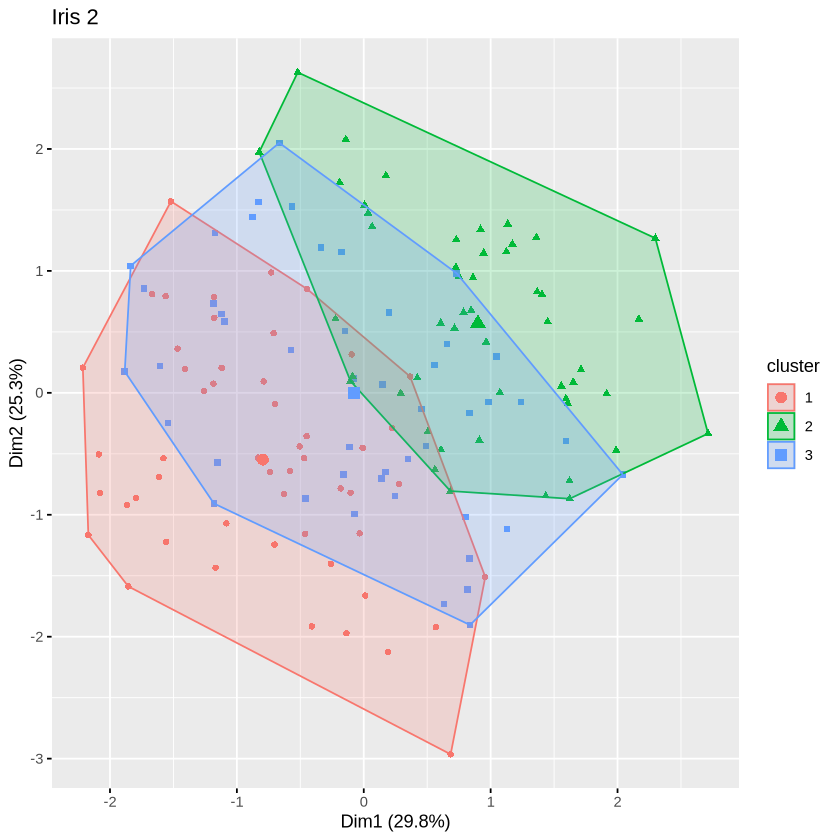

In [6]:
cluster <- kmeans(iris_2, centers = 3)

g1 <- fviz_cluster(cluster, data = iris_2, geom = "point", ellipse.type = "convex", main = "Iris 2")

plot(g1)


### Are there really clusters in the data?

$hopkins_stat
[1] 0.8191482

$plot


$hopkins_stat
[1] 0.4904035

$plot


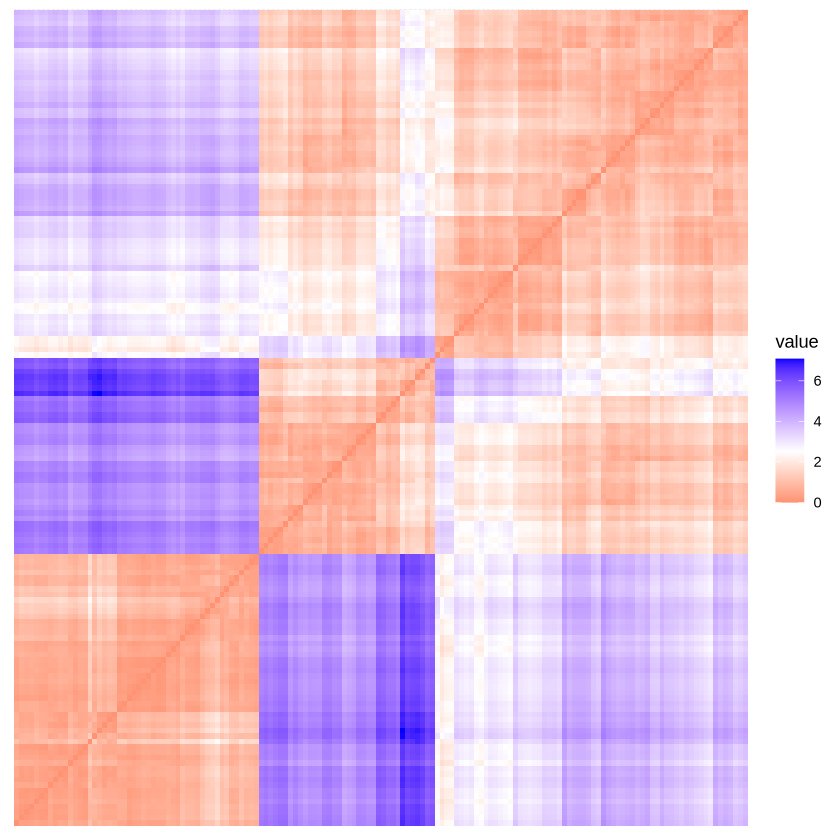

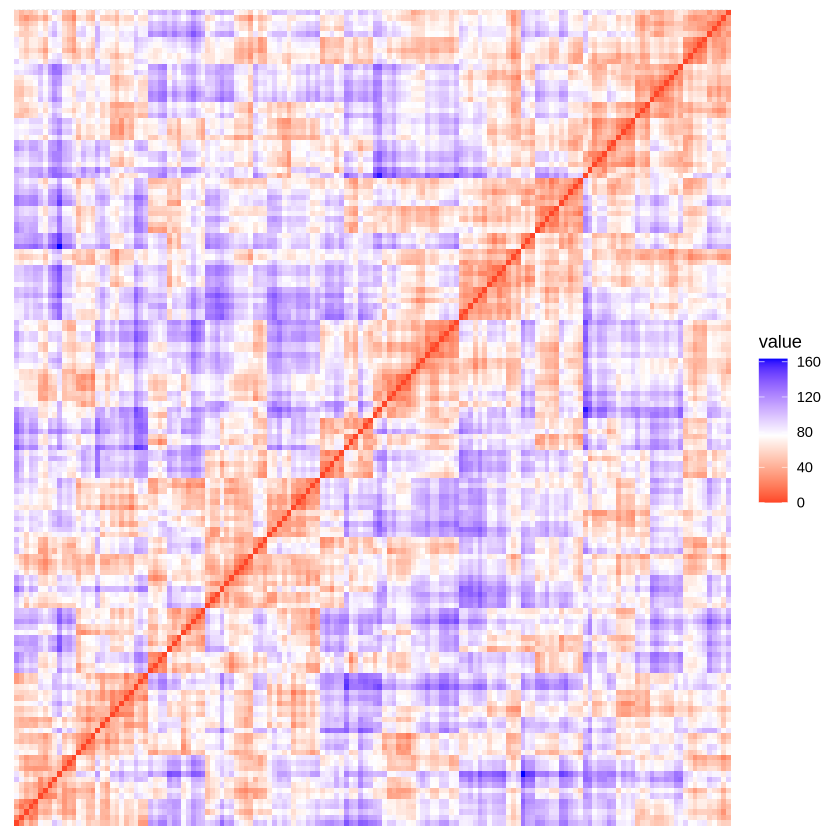

In [9]:
# Hopkins Statistic

# H0: The data is uniformly distributed
# H1: The data is not uniformly distributed

get_clust_tendency(iris_1, n = 50, graph = TRUE)
get_clust_tendency(iris_2, n = 50, graph = TRUE)


### What is the ideal number of clusters?

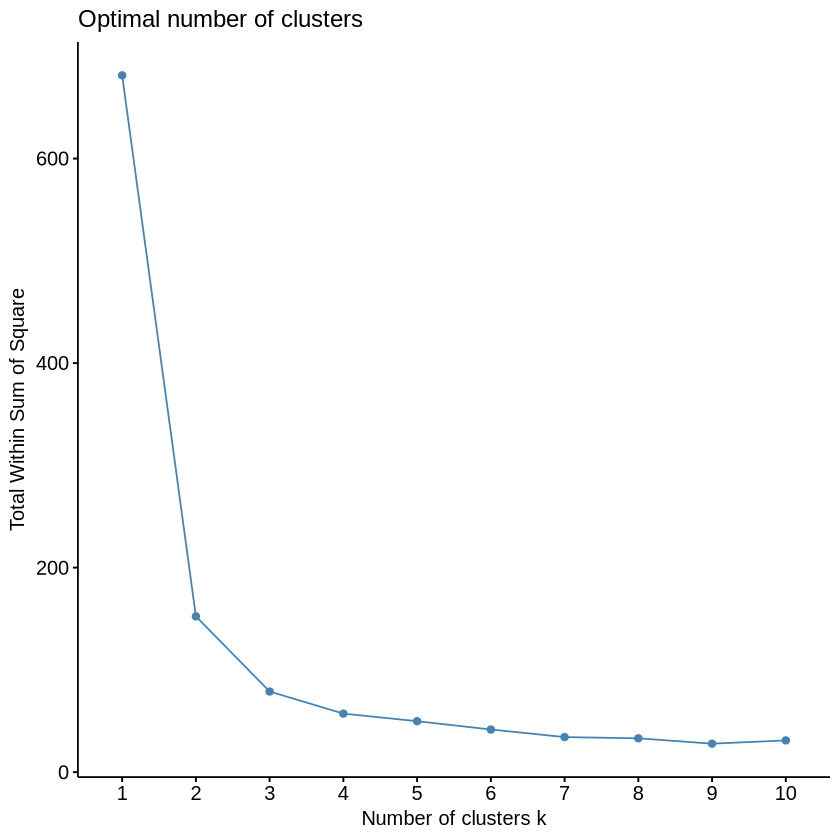

In [10]:
# Elbow Method: The optimal number of clusters is the one where the sum of squares within clusters is minimized
fviz_nbclust(iris_1, kmeans, method = "wss")


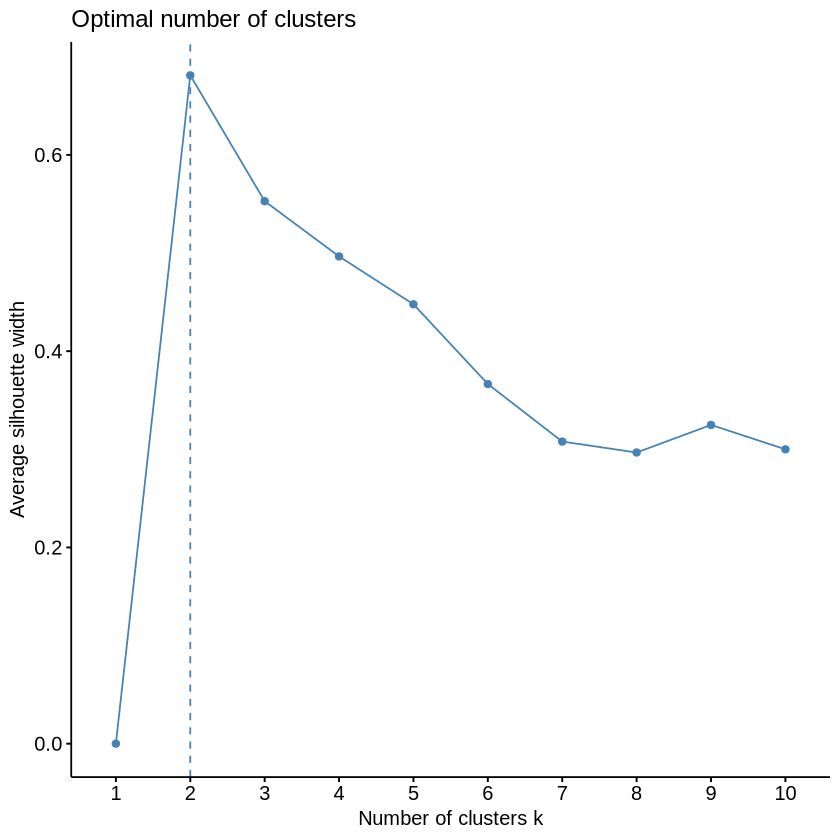

In [12]:
# Silhouette Method: The optimal number of clusters is the one that maximizes the average silhouette width
fviz_nbclust(iris_1, kmeans, method = "silhouette")


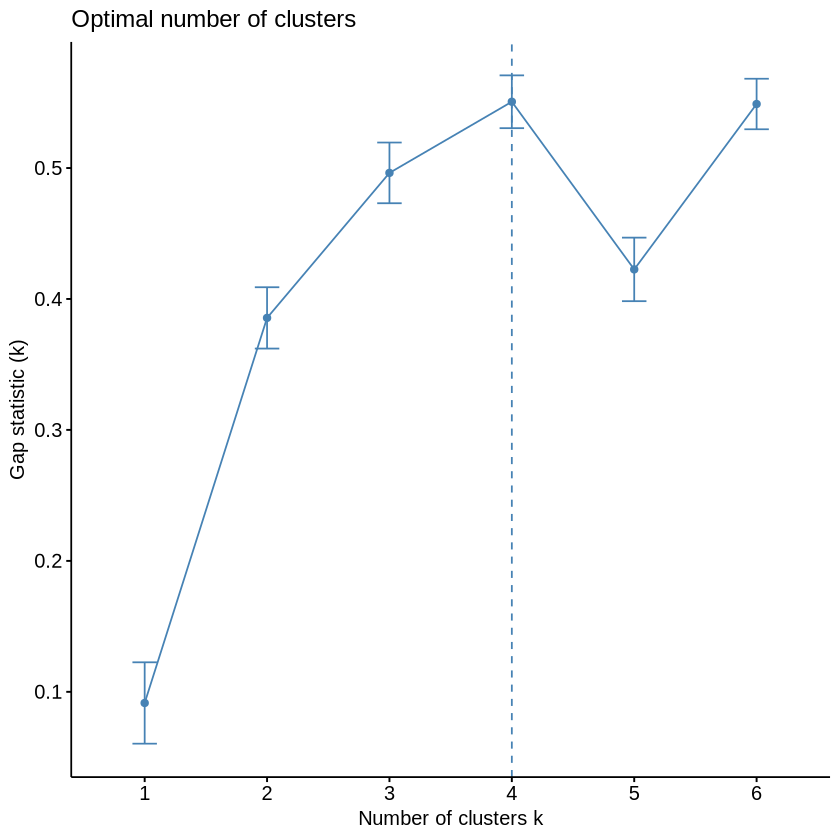

In [14]:
# Gap Statistic: The optimal number of clusters is the one that maximizes the gap statistic
gap <- clusGap(iris_1, FUN = kmeans, K.max = 6)

fviz_gap_stat(gap)


*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 


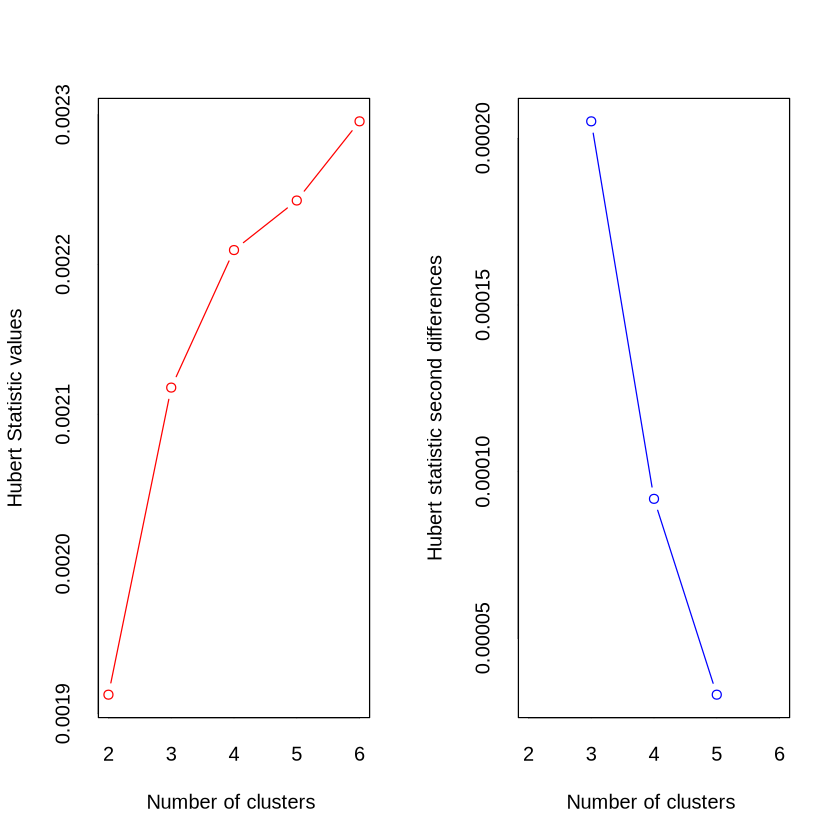

*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 11 proposed 2 as the best number of clusters 
* 11 proposed 3 as the best number of clusters 
* 2 proposed 6 as the best number of clusters 

                   ***** Conclusion *****                            
 
* According to the majority rule, the best number of clusters is  2 
 
 
******************************************************************* 


$All.index
       KL       CH Hartigan     CCC    Scott  Marriot    TrCovW   TraceW
2  5.9068 513.9245 137.9491 35.9428 1044.605 467371.6 1045.9696 152.3480
3 12.4890 561.6278  15.2384 37.6701 1246.668 273408.6  248.9814  78.8514
4  0.2006 415.4655  63.3643 33.4414 1296.511 348642.4  221.8632  71.4452
5  4.2008 459.5058  25.2963 34.3409 1415.662 246163.9  140.6758  49.8223
6  2.0868 433.7827   6.3415 33.3853 1505.840 194309.4   79.9311  42.4215
   Friedman    Rubin Cindex     DB Silhouette   Duda Pseudot2   Beale Ratkowsky
2  732.8086  62.6152 0.2728 0.4744     0.6810 1.9253 -52.8667 -1.1380    0.5462
3  801.6490 120.9780 0.3450 0.7256     0.5528 0.5112  45.9014  2.2615    0.4967
4  850.7642 133.5189 0.3485 0.9484     0.4152 0.5870  46.4403  1.6709    0.4440
5  936.2996 191.4664 0.3327 0.9987     0.3728 1.0842  -3.8046 -0.1814    0.4067
6 1070.5134 224.8690 0.3596 1.0808     0.3357 1.0328  -1.1759 -0.0739    0.3733
     Ball Ptbiserial     Frey McClain   Dunn Hubert SDindex Dindex   SDbw
2 76.1740     0.8345   1.7571  0.2723 0.0765 0.0019  1.0158 0.8556 0.1618
3 26.2838     0.7146 -20.7325  0.5255 0.0988 0.0021  1.5740 0.6480 0.2257
4 17.8613     0.6250   1.0780  0.7275 0.0528 0.0022  3.0078 0.6055 0.2351
5  9.9645     0.5521   1.3588  0.9903 0.0624 0.0022  3.1101 0.5148 0.1542
6  7.0703     0.5034 -11.9269  1.2043 0.0739 0.0023  3.2818 0.4811 0.1149

$All.CriticalValues
  CritValue_Duda CritValue_PseudoT2 Fvalue_Beale
2         0.5633            85.2756       1.0000
3         0.5551            38.4707       0.0640
4         0.5842            46.9673       0.1574
5         0.4837            52.3097       1.0000
6         0.4590            43.6093       1.0000

$Best.nc
                    KL       CH Hartigan     CCC    Scott  Marriot   TrCovW
Number_clusters  3.000   3.0000   3.0000  3.0000   3.0000      3.0   3.0000
Value_Index     12.489 561.6278 122.7107 37.6701 202.0631 269196.9 796.9882
                 TraceW Friedman   Rubin Cindex     DB Silhouette   Duda
Number_clusters  3.0000   6.0000   3.000 2.0000 2.0000      2.000 2.0000
Value_Index     66.0903 134.2139 -45.822 0.2728 0.4744      0.681 1.9253
                PseudoT2  Beale Ratkowsky    Ball PtBiserial   Frey McClain
Number_clusters   2.0000  2.000    2.0000  3.0000     2.0000 2.0000  2.0000
Value_Index     -52.8667 -1.138    0.5462 49.8902     0.8345 1.7571  0.2723
                  Dunn Hubert SDindex Dindex   SDbw
Number_clusters 3.0000      0  2.0000      0 6.0000
Value_Index     0.0988      0  1.0158      0 0.1149

$Best.partition
  [1] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [38] 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [75] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2
[112] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
[149] 2 2

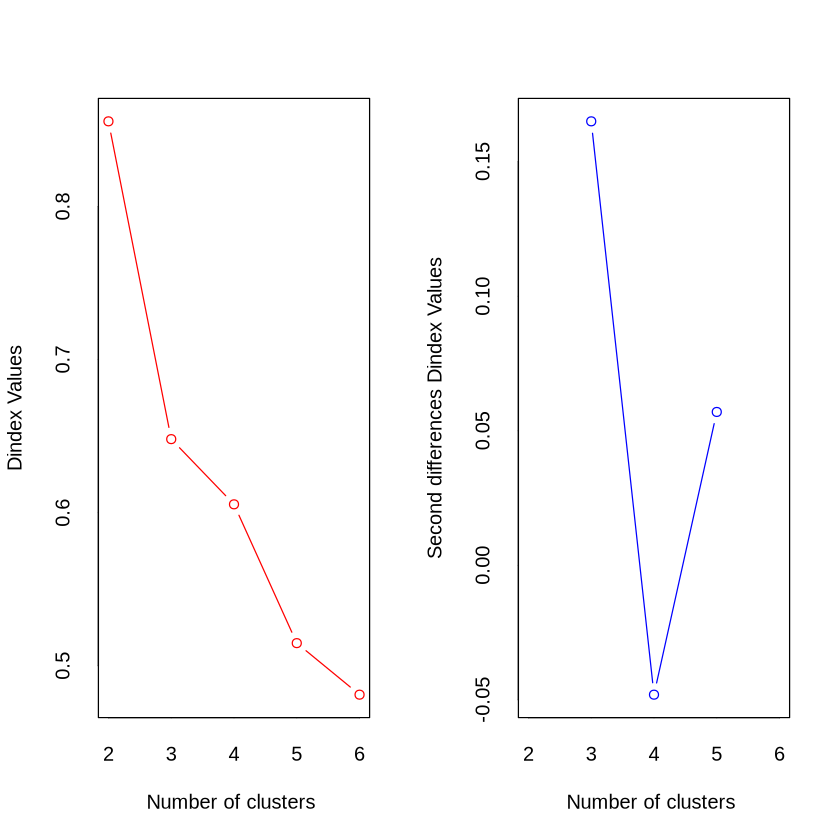

In [15]:
# NbClust: The optimal number of clusters is the one that maximizes the average of all indices

NbClust(iris_1, diss = NULL, distance = "euclidean", min.nc = 2, max.nc = 6, method = "kmeans")

# The optimal number of clusters is 3


### Have good clusters been produced?

In [22]:
# Dunn index: The optimal number of clusters is the one that maximizes the Dunn index

x <- kmeans(iris_1, centers = 4)
dunn4 <- cluster.stats(d = dist(iris_1), x$cluster)

dunn4$dunn2


[1] 1.393073

In [19]:
x <- kmeans(iris_1, centers = 3)
dunn3 <- cluster.stats(d = dist(iris_1), x$cluster)

dunn3$dunn2


[1] 1.886531

In [20]:
x <- kmeans(iris_1, centers = 2)
dunn2 <- cluster.stats(d = dist(iris_1), x$cluster)

dunn2$dunn2


[1] 2.850814

In [23]:
# All indices
# dunn4


### Do we use the best bundler?

In [24]:
# clValid: The optimal number of clusters is the one that maximizes the average of all indices

bundlers <- clValid(iris_1, 2:6, clMethods = c("hierarchical", "kmeans", "pam"), validation = "internal")

summary(bundlers)


Warning message in clValid(iris_1, 2:6, clMethods = c("hierarchical", "kmeans", :
“rownames for data not specified, using 1:nrow(data)”



Clustering Methods:
 hierarchical kmeans pam 

Cluster sizes:
 2 3 4 5 6 

Validation Measures:
                                 2       3       4       5       6
                                                                  
hierarchical Connectivity   0.0000  4.4770  8.9929 15.4893 18.4183
             Dunn           0.3389  0.1378  0.1540  0.1540  0.1668
             Silhouette     0.6867  0.5542  0.4720  0.4307  0.3420
kmeans       Connectivity   6.1536 10.0917 17.5194 27.9373 36.4873
             Dunn           0.0765  0.0988  0.1365  0.0823  0.0853
             Silhouette     0.6810  0.5528  0.4981  0.4887  0.3648
pam          Connectivity   3.9623 10.0917 24.1675 28.5984 43.8631
             Dunn           0.0811  0.0988  0.1008  0.1235  0.0921
             Silhouette     0.6858  0.5528  0.4897  0.4867  0.4704

Optimal Scores:

             Score  Method       Clusters
Connectivity 0.0000 hierarchical 2       
Dunn         0.3389 hierarchical 2       
Silhouette   0.6867 hi

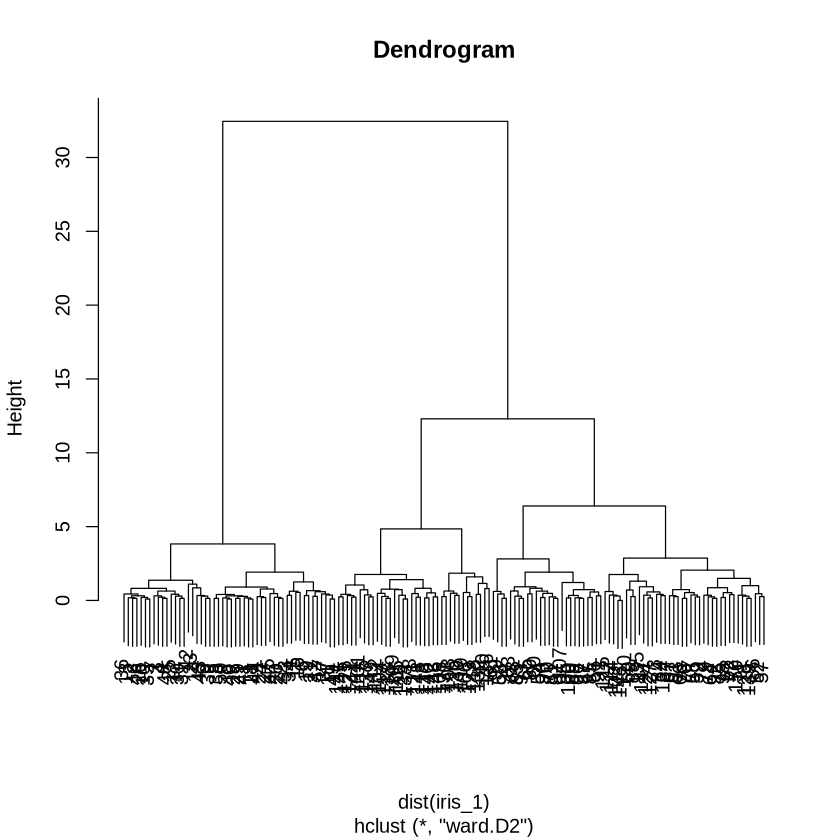

In [37]:
cluster <- hclust(dist(iris_1), method = "ward.D2")


plot(cluster, main = "Dendrogram")